# GB656 Data Science Competition -- Flu Shot Learning -- Zihao Li

Load packages:

In [1]:
import graphviz
import numpy as np
import pandas as pd
import seaborn as sns
from io import StringIO
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, export_graphviz
from sklearn.metrics import mean_squared_error, confusion_matrix, classification_report, roc_curve, auc
from sklearn.ensemble import (BaggingClassifier, RandomForestClassifier, BaggingRegressor,
                              RandomForestRegressor, GradientBoostingRegressor, GradientBoostingClassifier,
                              AdaBoostClassifier)

In [2]:
import pydot
from IPython.display import Image
def print_tree(estimator, features, class_names=None, filled=True):
  tree = estimator
  names = features
  color = filled
  classn = class_names
  dot_data = StringIO()
  export_graphviz(estimator, out_file=dot_data,feature_names=features,class_names=classn, filled=filled)
  graph = pydot.graph_from_dot_data(dot_data.getvalue())
  return(graph)

In [3]:
#Upload data
from google.colab import files
uploaded = files.upload()

Saving submission_format.csv to submission_format.csv
Saving test_set_features.csv to test_set_features.csv
Saving training_set_features.csv to training_set_features.csv
Saving training_set_labels.csv to training_set_labels.csv


In [4]:
# Save upload data into different df
df_train = pd.read_csv('training_set_features.csv')
df_train_result = pd.read_csv('training_set_labels.csv')
df_test = pd.read_csv('test_set_features.csv')
df_final = pd.read_csv('submission_format.csv')

In [5]:
# Add column h1n1_vaccine and seasonal_vaccine from df_train_result into df_train
df_train['h1n1_vaccine'] = df_train_result['h1n1_vaccine']
df_train['seasonal_vaccine'] = df_train_result['seasonal_vaccine']

In [6]:
# For each column with missing data, randomly sample non-missing values and use these to fill the NaNs
for column in df_train.columns:
    if df_train[column].isnull().any():
        # Get a list of indices for NaN values in this column
        nan_indices = df_train[df_train[column].isnull()].index
        # Randomly sample from the non-NaN values in this column, one for each NaN
        fill_values = df_train[column].dropna().sample(n=len(nan_indices), random_state=0, replace=True).values
        # Assign the fill values to the NaNs in the DataFrame
        df_train.loc[nan_indices, column] = fill_values

# Check if there are any null values left
null_values_after = df_train.isnull().sum().sum()

In [7]:
# Define a mapping for each categorical column for df_train
#(which distinct the category and by using the number)
mappings = {
    'age_group': {value: i for i, value in enumerate(df_train['age_group'].unique())},
    'education': {value: i for i, value in enumerate(df_train['education'].unique())},
    'race': {value: i for i, value in enumerate(df_train['race'].unique())},
    'sex': {'Male': 0, 'Female': 1},
    'income_poverty': {value: i for i, value in enumerate(df_train['income_poverty'].unique())},
    'marital_status': {value: i for i, value in enumerate(df_train['marital_status'].unique())},
    'rent_or_own': {value: i for i, value in enumerate(df_train['rent_or_own'].unique())},
    'employment_status': {value: i for i, value in enumerate(df_train['employment_status'].unique())},
    'hhs_geo_region': {value: i for i, value in enumerate(df_train['hhs_geo_region'].unique())},
    'census_msa': {value: i for i, value in enumerate(df_train['census_msa'].unique())},
    'employment_industry': {value: i for i, value in enumerate(df_train['employment_industry'].unique())},
    'employment_occupation': {value: i for i, value in enumerate(df_train['employment_occupation'].unique())}
}

# Apply the mappings to the dataframe
for column, mapping in mappings.items():
    df_train[column].replace(mapping, inplace=True)

In [8]:
# For each column with missing data, randomly sample non-missing values and use these to fill the NaNs
for column in df_test.columns:
    if df_test[column].isnull().any():
        # Get a list of indices for NaN values in this column
        nan_indices = df_test[df_test[column].isnull()].index
        # Randomly sample from the non-NaN values in this column, one for each NaN
        fill_values = df_test[column].dropna().sample(n=len(nan_indices), random_state=0, replace=True).values
        # Assign the fill values to the NaNs in the DataFrame
        df_test.loc[nan_indices, column] = fill_values

# Check if there are any null values left
null_values_after = df_test.isnull().sum().sum()

In [9]:
# Define a mapping for each categorical column for df_test
#(which distinct the category and by using the number)
mappings1 = {
    'age_group': {value: i for i, value in enumerate(df_test['age_group'].unique())},
    'education': {value: i for i, value in enumerate(df_test['education'].unique())},
    'race': {value: i for i, value in enumerate(df_test['race'].unique())},
    'sex': {'Male': 0, 'Female': 1},
    'income_poverty': {value: i for i, value in enumerate(df_test['income_poverty'].unique())},
    'marital_status': {value: i for i, value in enumerate(df_test['marital_status'].unique())},
    'rent_or_own': {value: i for i, value in enumerate(df_test['rent_or_own'].unique())},
    'employment_status': {value: i for i, value in enumerate(df_test['employment_status'].unique())},
    'hhs_geo_region': {value: i for i, value in enumerate(df_test['hhs_geo_region'].unique())},
    'census_msa': {value: i for i, value in enumerate(df_test['census_msa'].unique())},
    'employment_industry': {value: i for i, value in enumerate(df_test['employment_industry'].unique())},
    'employment_occupation': {value: i for i, value in enumerate(df_test['employment_occupation'].unique())}
}

# Apply the mappings to the dataframe
for column, mapping in mappings1.items():
    df_test[column].replace(mapping, inplace=True)

In [10]:
y = df_train['seasonal_vaccine']
X = df_train.drop(columns=['respondent_id','h1n1_vaccine','seasonal_vaccine'])
X = sm.add_constant(X) # Add a constant term as the default model doesn't include one
model = sm.OLS(y, X).fit()
# Check regression results
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       seasonal_vaccine   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     353.8
Date:                Sat, 16 Dec 2023   Prob (F-statistic):               0.00
Time:                        21:24:46   Log-Likelihood:                -14227.
No. Observations:               26707   AIC:                         2.853e+04
Df Residuals:                   26671   BIC:                         2.882e+04
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -0.2858      0.019    -15.254      0.000      -0.322      -0.249
h1n1_concern                    0.0054      0.003      1.628      0.103      -0.001       0.012
h1n1_knowledge                  0.0307      0.004      6.987      0.000       0.022       0.039
behavioral_antiviral_meds      -0.0026      0.012     -0.212      0.832      -0.026       0.021
behavioral_avoidance           -0.0106      0.006     -1.671      0.095      -0.023       0.002
behavioral_face_mask            0.0036      0.010      0.350      0.726      -0.017       0.024
behavioral_wash_hands           0.0105      0.008      1.388      0.165      -0.004       0.025
behavioral_large_gatherings     0.0040      0.007      0.596      0.551      -0.009       0.017
behavioral_outside_home        -0.0036      0.007     -0.526      0.599      -0.017       0.010
behavioral_touch_face           0.0425      0.006      6.887      0.000       0.030       0.055
doctor_recc_h1n1               -0.0619      0.008     -7.993      0.000      -0.077      -0.047
doctor_recc_seasonal            0.2522      0.007     36.764      0.000       0.239       0.266
chronic_med_condition           0.0590      0.006     10.036      0.000       0.047       0.071
child_under_6_months            0.0072      0.009      0.774      0.439      -0.011       0.025
health_worker                   0.1345      0.008     15.858      0.000       0.118       0.151
health_insurance                0.0699      0.008      8.734      0.000       0.054       0.086
opinion_h1n1_vacc_effective     0.0017      0.003      0.599      0.549      -0.004       0.007
opinion_h1n1_risk               0.0038      0.003      1.500      0.134      -0.001       0.009
opinion_h1n1_sick_from_vacc    -0.0113      0.002     -4.964      0.000      -0.016      -0.007
opinion_seas_vacc_effective     0.0889      0.003     32.137      0.000       0.084       0.094
opinion_seas_risk               0.0945      0.002     40.504      0.000       0.090       0.099
opinion_seas_sick_from_vacc    -0.0313      0.002    -14.196      0.000      -0.036      -0.027
age_group                       0.0092      0.002      5.135      0.000       0.006       0.013
education                       0.0020      0.003      0.712      0.476      -0.004       0.008
race                           -0.0130      0.003     -4.106      0.000      -0.019      -0.007
sex                             0.0028      0.005      0.522      0.601      -0.008       0.013
income_poverty                  0.0164      0.005      3.616      0.000       0.008       0.025
marital_status                  0.0397      0.006      6.788      0.000       0.028       0.051
rent_or_own                    -0.0593      0.006     -9.196      0.000      -0.072      -0.047
employment_

In [11]:
# running backward selection to find best model
y = df_train['seasonal_vaccine']
X = df_train.drop(columns=['respondent_id','h1n1_vaccine','seasonal_vaccine'], axis=1)
X = sm.add_constant(X)

def backward_elimination(X, y, significance_level = 0.05):
    num_vars = len(X.columns)
    for i in range(0, num_vars):
        regressor_OLS = sm.OLS(y, X).fit()
        max_p_value = max(regressor_OLS.pvalues)
        if max_p_value > significance_level:
            for j in range(0, num_vars - i):
                if (regressor_OLS.pvalues[j] == max_p_value):
                    X = X.drop(X.columns[j], axis=1)
    regressor_OLS.summary()
    return X

X_optimal = backward_elimination(X, y)

print(X_optimal.columns)


Index(['const', 'h1n1_concern', 'h1n1_knowledge', 'behavioral_touch_face',
       'doctor_recc_h1n1', 'doctor_recc_seasonal', 'chronic_med_condition',
       'health_worker', 'health_insurance', 'opinion_h1n1_sick_from_vacc',
       'opinion_seas_vacc_effective', 'opinion_seas_risk',
       'opinion_seas_sick_from_vacc', 'age_group', 'race', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'census_msa',
       'household_adults', 'household_children', 'employment_industry',
       'employment_occupation'],
      dtype='object')


In [13]:
df_train_seasonal_vaccine =df_train[['h1n1_concern', 'h1n1_knowledge', 'behavioral_touch_face',
       'doctor_recc_h1n1', 'doctor_recc_seasonal', 'chronic_med_condition',
       'health_worker', 'health_insurance', 'opinion_h1n1_sick_from_vacc',
       'opinion_seas_vacc_effective', 'opinion_seas_risk',
       'opinion_seas_sick_from_vacc', 'age_group', 'race', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'census_msa',
       'household_adults', 'household_children', 'employment_industry',
       'employment_occupation','seasonal_vaccine']]

In [14]:
y = df_train['h1n1_vaccine']
X = df_train.drop(columns=['respondent_id','h1n1_vaccine','seasonal_vaccine'], axis=1)
X = sm.add_constant(X)

def backward_elimination(X, y, significance_level = 0.05):
    num_vars = len(X.columns)
    for i in range(0, num_vars):
        regressor_OLS = sm.OLS(y, X).fit()
        max_p_value = max(regressor_OLS.pvalues)
        if max_p_value > significance_level:
            for j in range(0, num_vars - i):
                if (regressor_OLS.pvalues[j] == max_p_value):
                    X = X.drop(X.columns[j], axis=1)
    regressor_OLS.summary()
    return X

X_optimal = backward_elimination(X, y)

print(X_optimal.columns)

Index(['const', 'h1n1_concern', 'h1n1_knowledge', 'behavioral_face_mask',
       'behavioral_large_gatherings', 'doctor_recc_h1n1',
       'doctor_recc_seasonal', 'chronic_med_condition', 'child_under_6_months',
       'health_worker', 'health_insurance', 'opinion_h1n1_vacc_effective',
       'opinion_h1n1_risk', 'opinion_seas_vacc_effective', 'opinion_seas_risk',
       'opinion_seas_sick_from_vacc', 'sex', 'income_poverty',
       'marital_status', 'employment_status', 'hhs_geo_region',
       'household_children', 'employment_industry', 'employment_occupation'],
      dtype='object')


In [15]:
df_train_h1n1_vaccine = df_train[['h1n1_concern', 'h1n1_knowledge', 'behavioral_face_mask',
       'behavioral_large_gatherings', 'doctor_recc_h1n1',
       'doctor_recc_seasonal', 'chronic_med_condition', 'child_under_6_months',
       'health_worker', 'health_insurance', 'opinion_h1n1_vacc_effective',
       'opinion_h1n1_risk', 'opinion_seas_vacc_effective', 'opinion_seas_risk',
       'opinion_seas_sick_from_vacc', 'sex', 'income_poverty',
       'marital_status', 'employment_status', 'hhs_geo_region',
       'household_children', 'employment_industry', 'employment_occupation','h1n1_vaccine']]

## Gradient Boosting Model - H1N1

In [16]:
train, test = train_test_split(df_train_h1n1_vaccine, test_size = 0.5)
val, test = train_test_split(test, test_size = 0.5)

X_train = train.drop(columns = ['h1n1_vaccine']).values
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
y_train = train['h1n1_vaccine'].values
X_val = val.drop(columns = ['h1n1_vaccine']).values
X_val = scaler.transform(X_val)
y_val = val['h1n1_vaccine'].values
X_test = test.drop(columns = ['h1n1_vaccine']).values
X_test = scaler.transform(X_test)
y_test = test['h1n1_vaccine'].values

In [17]:
h1n1_boost_base = GradientBoostingClassifier(random_state=1)
h1n1_boost_base.fit(X_train, y_train)

GradientBoostingClassifier(random_state=1)

In [18]:
h1n1_boost_base_pred = h1n1_boost_base.predict(X_test)
fpr, tpr, threshold = roc_curve(y_test, h1n1_boost_base_pred)
roc_auc = auc(fpr, tpr)
roc_auc

0.6822356193708463

In [19]:
h1n1_boost_slow_many = GradientBoostingClassifier(n_estimators=1400, learning_rate=0.015,random_state=1)
h1n1_boost_slow_many.fit(X_train, y_train)
h1n1_boost_slow_many_pred = h1n1_boost_slow_many.predict(X_val)
fpr, tpr, threshold = roc_curve(y_val, h1n1_boost_slow_many_pred)
roc_auc = auc(fpr, tpr)
roc_auc

0.6825639945910039

In [20]:
h1n1_boost_fast_few = GradientBoostingClassifier(n_estimators=400, learning_rate=0.075,random_state=1)
h1n1_boost_fast_few.fit(X_train, y_train)
h1n1_boost_fast_few_pred = h1n1_boost_fast_few.predict(X_val)
fpr, tpr, threshold = roc_curve(y_val, h1n1_boost_fast_few_pred)
roc_auc = auc(fpr, tpr)
roc_auc

0.6861366305276143

In [21]:
h1n1_boost = GradientBoostingClassifier(n_estimators=400, learning_rate=0.075,random_state=1)
h1n1_boost.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.075, n_estimators=400,
                           random_state=1)

In [22]:
h1n1_boost_preds = h1n1_boost.predict(X_test)

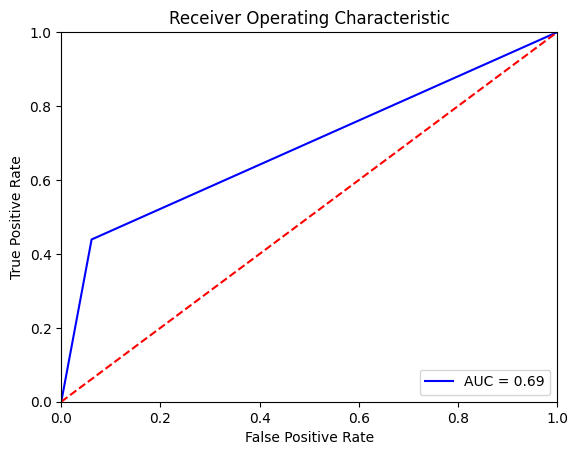

In [23]:
fpr, tpr, threshold = roc_curve(test['h1n1_vaccine'], h1n1_boost_preds)
roc_auc = auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [24]:
roc_auc

0.6889233090515534

In [ ]:
confusion_matrix(test['h1n1_vaccine'], (h1n1_boost_preds > 0.5))

array([[872, 276],
       [354, 108]])

## Tree Classifier - H1N1

In [ ]:
h1n1_tree = DecisionTreeClassifier(min_samples_split=5,min_impurity_decrease=0.0001)
h1n1_tree.fit(X_train, y_train)
graph, = print_tree(h1n1_tree, features= train.drop(columns = ['h1n1_vaccine']).columns)
Image(graph.create_png())

In [ ]:
h1n1_tree_preds = h1n1_tree.predict(X_val)

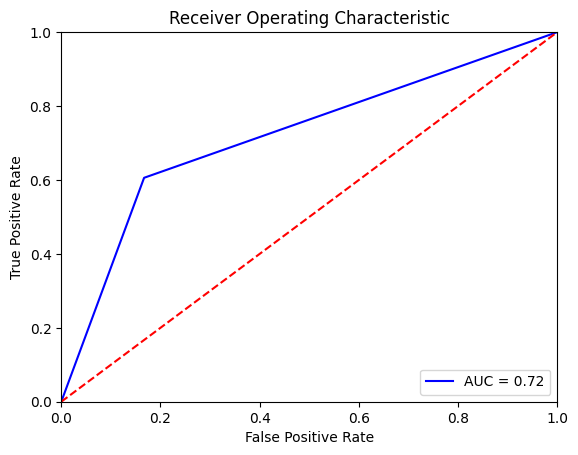

In [ ]:
fpr, tpr, threshold = roc_curve(val['h1n1_vaccine'], h1n1_tree_preds)
roc_auc = auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

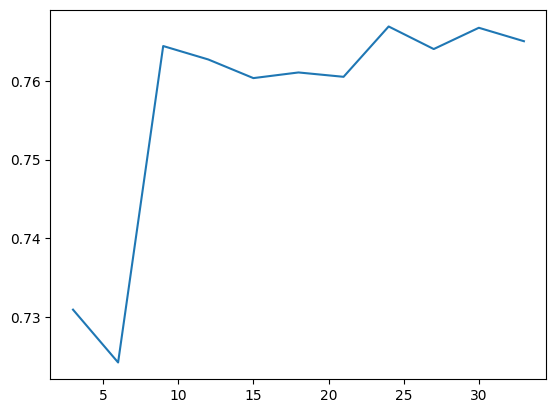

In [ ]:
AUC_scores = []
scores = []
for i in range(3,36,3):
    h1n1_tree_try = DecisionTreeClassifier(min_samples_split=5,min_impurity_decrease=0.0001,max_leaf_nodes=i)
    h1n1_tree_try.fit(X_train, y_train)
    h1n1_tree_try_preds = h1n1_tree_try.predict(X_val)
    fpr, tpr, threshold = roc_curve(val['h1n1_vaccine'], h1n1_tree_try_preds)
    AUC_scores.append(auc(fpr, tpr))
plt.plot(range(3,36,3),AUC_scores)

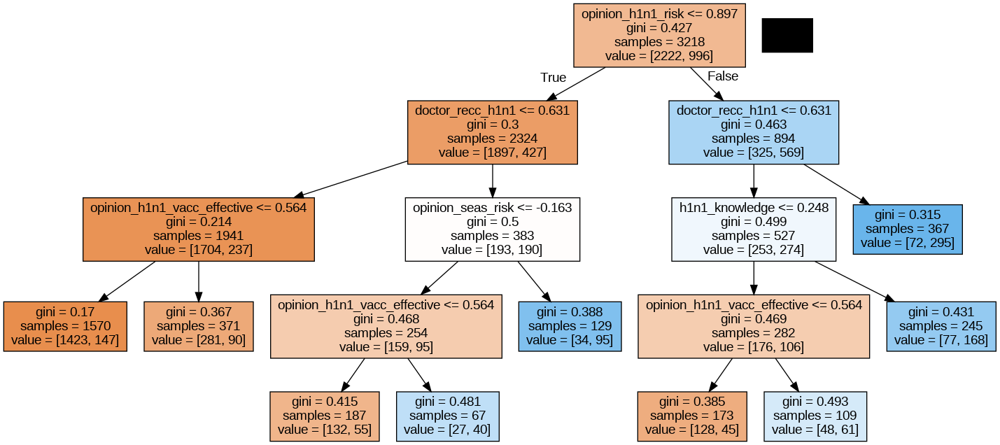

In [ ]:
h1n1_tree_final = DecisionTreeClassifier(min_samples_split=5,min_impurity_decrease=0.0001,max_leaf_nodes=9)
h1n1_tree_final.fit(X_train, y_train)
graph, = print_tree(h1n1_tree_final, features= train.drop(columns = ['h1n1_vaccine']).columns)
Image(graph.create_png())

In [ ]:
h1n1_tree_final_preds = h1n1_tree_final.predict(X_test)
h1n1_tree_final_preds_labels = h1n1_tree_final_preds > 0.5

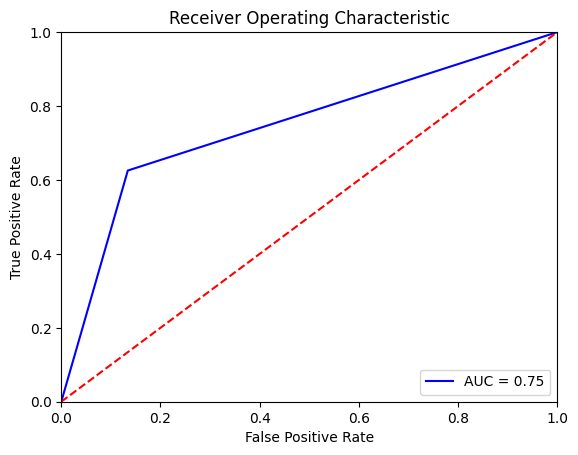

In [ ]:
fpr, tpr, threshold = roc_curve(test['h1n1_vaccine'], h1n1_tree_final_preds)
roc_auc = auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Not as good as Gradient Boosting Model so i will use Gradient Boosting Model.

In [25]:
df_test_final_h1n1 = df_test[['h1n1_concern', 'h1n1_knowledge', 'behavioral_face_mask',
       'behavioral_large_gatherings', 'doctor_recc_h1n1',
       'doctor_recc_seasonal', 'chronic_med_condition', 'child_under_6_months',
       'health_worker', 'health_insurance', 'opinion_h1n1_vacc_effective',
       'opinion_h1n1_risk', 'opinion_seas_vacc_effective', 'opinion_seas_risk',
       'opinion_seas_sick_from_vacc', 'sex', 'income_poverty',
       'marital_status', 'employment_status', 'hhs_geo_region',
       'household_children', 'employment_industry', 'employment_occupation']]

In [26]:
h1n1_boost_preds = h1n1_boost.predict_proba(df_test_final_h1n1)[:, 1]

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(


In [27]:
df_final['h1n1_vaccine'] = h1n1_boost_preds

# Gradient Boosting Model - Seasonal

In [28]:
train, test = train_test_split(df_train_seasonal_vaccine, test_size = 0.5)
val, test = train_test_split(test, test_size = 0.5)

X_train = train.drop(columns = ['seasonal_vaccine']).values
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
y_train = train['seasonal_vaccine'].values
X_val = val.drop(columns = ['seasonal_vaccine']).values
X_val = scaler.transform(X_val)
y_val = val['seasonal_vaccine'].values
X_test = test.drop(columns = ['seasonal_vaccine']).values
X_test = scaler.transform(X_test)
y_test = test['seasonal_vaccine'].values

In [29]:
seanoal_boost_base = GradientBoostingClassifier(random_state=1)
seanoal_boost_base.fit(X_train, y_train)

GradientBoostingClassifier(random_state=1)

In [30]:
seanoal_boost_base_pred = seanoal_boost_base.predict(X_test)
fpr, tpr, threshold = roc_curve(y_test, seanoal_boost_base_pred)
roc_auc = auc(fpr, tpr)
roc_auc

0.7774702723357318

In [31]:
seanoal_boost_slow_many = GradientBoostingClassifier(n_estimators=1400, learning_rate=0.015,random_state=1)
seanoal_boost_slow_many.fit(X_train, y_train)
seanoal_boost_slow_many_pred = seanoal_boost_slow_many.predict(X_val)
fpr, tpr, threshold = roc_curve(y_val, seanoal_boost_slow_many_pred)
roc_auc = auc(fpr, tpr)
roc_auc

0.786910387242545

In [32]:
seanoal_boost_slow_many = GradientBoostingClassifier(n_estimators=400, learning_rate=0.075,random_state=1)
seanoal_boost_slow_many.fit(X_train, y_train)
seanoal_boost_slow_many_pred = seanoal_boost_slow_many.predict(X_val)
fpr, tpr, threshold = roc_curve(y_val, seanoal_boost_slow_many_pred)
roc_auc = auc(fpr, tpr)
roc_auc

0.7866894444028866

In [33]:
seanoal_boost = GradientBoostingClassifier(n_estimators=400, learning_rate=0.075,random_state=1)
seanoal_boost.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.075, n_estimators=400,
                           random_state=1)

In [34]:
seanoal_boost_preds = seanoal_boost.predict(X_test)

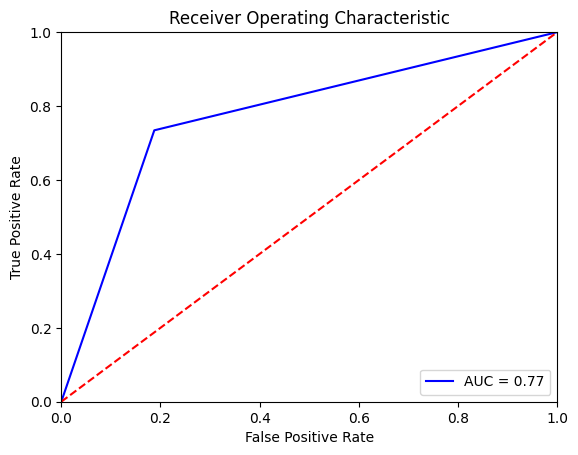

In [35]:
fpr, tpr, threshold = roc_curve(test['seasonal_vaccine'], seanoal_boost_preds)
roc_auc = auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Tree Classifier - Seasonal

In [ ]:
seanoal_tree = DecisionTreeClassifier(min_samples_split=5,min_impurity_decrease=0.0001)
seanoal_tree.fit(X_train, y_train)
graph, = print_tree(seanoal_tree, features= train.drop(columns = ['seasonal_vaccine']).columns)
Image(graph.create_png())

In [ ]:
seanoal_tree_preds = seanoal_tree.predict(X_val)

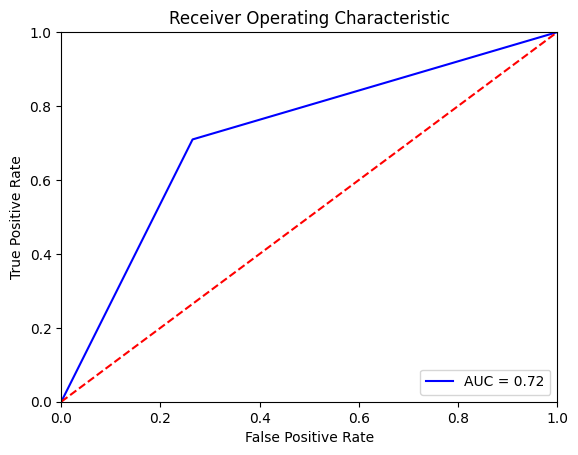

In [ ]:
fpr, tpr, threshold = roc_curve(val['seasonal_vaccine'], seanoal_tree_preds)
roc_auc = auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

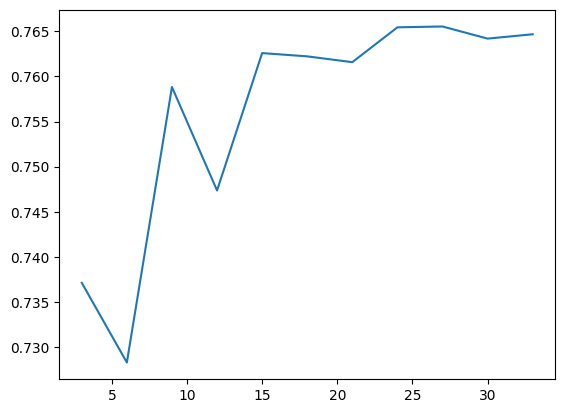

In [ ]:
AUC_scores = []
scores = []
for i in range(3,36,3):
    seanoal_tree_try = DecisionTreeClassifier(min_samples_split=5,min_impurity_decrease=0.0001,max_leaf_nodes=i)
    seanoal_tree_try.fit(X_train, y_train)
    seanoal_tree_try_preds = seanoal_tree_try.predict(X_val)
    fpr, tpr, threshold = roc_curve(val['seasonal_vaccine'], seanoal_tree_try_preds)
    AUC_scores.append(auc(fpr, tpr))
plt.plot(range(3,36,3),AUC_scores)

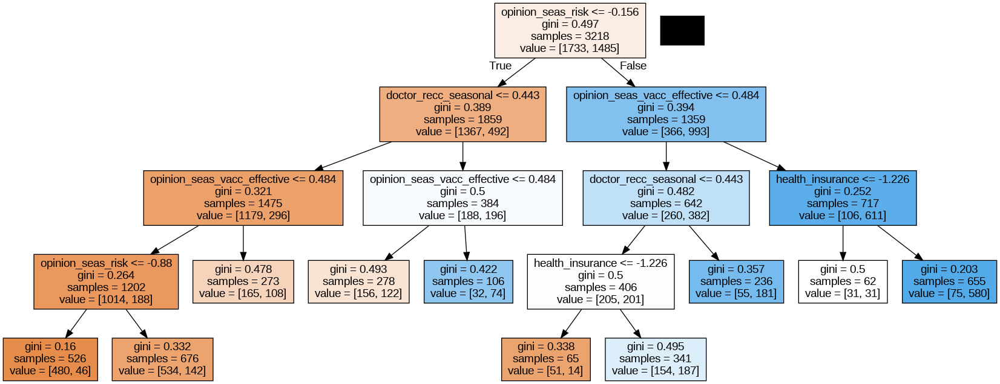

In [ ]:
seanoal_tree_final = DecisionTreeClassifier(min_samples_split=5,min_impurity_decrease=0.0001,max_leaf_nodes=10)
seanoal_tree_final.fit(X_train, y_train)
graph, = print_tree(seanoal_tree_final, features= train.drop(columns = ['seasonal_vaccine']).columns)
Image(graph.create_png())

In [ ]:
seanoal_tree_final_preds = seanoal_tree_final.predict(X_test)
seanoal_tree_final_preds_labels = seanoal_tree_final_preds > 0.5

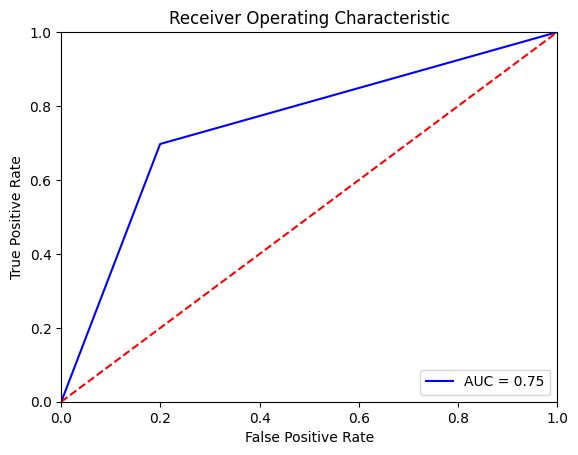

In [ ]:
fpr, tpr, threshold = roc_curve(test['seasonal_vaccine'], seanoal_tree_final_preds)
roc_auc = auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [36]:
df_test_final_Seasonal = df_test[['h1n1_concern', 'h1n1_knowledge', 'behavioral_touch_face',
       'doctor_recc_h1n1', 'doctor_recc_seasonal', 'chronic_med_condition',
       'health_worker', 'health_insurance', 'opinion_h1n1_sick_from_vacc',
       'opinion_seas_vacc_effective', 'opinion_seas_risk',
       'opinion_seas_sick_from_vacc', 'age_group', 'race', 'income_poverty',
       'marital_status', 'rent_or_own', 'employment_status', 'census_msa',
       'household_adults', 'household_children', 'employment_industry',
       'employment_occupation']]

In [37]:
seasonal_boost_preds = h1n1_boost.predict_proba(df_test_final_Seasonal)[:, 1]

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(


In [38]:
df_final['seasonal_vaccine'] = seasonal_boost_preds

# Download Final data

In [39]:
# prompt: download df_fila which convert into csv first and download it

df_final.to_csv('flu shot.csv', index=False)
files.download('flu shot.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>